## Emotion detection of audio data with CNN

## Importing all the required libraries here.

In [1]:
#For accessing dataset
!pip uninstall --yes gdown # After running this line, restart Colab runtime.
!pip install gdown -U --no-cache-dir


ERROR: Invalid requirement: '#'


In [2]:
#For audio analysis
!pip install librosa

In [3]:
#Downloading files from google drive link.
import gdown

url = r'https://drive.google.com/drive/folders/1P6lTAwjt64b_K4lldMMYN9l8KmAUAkh0?usp=sharing'
gdown.download_folder(url)

Retrieving folder contents


Processing file 1W-E-NA0C_tEGK4AZPMMr4f2qxunwf8-x Audio_data.zip


Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From (original): https://drive.google.com/uc?id=1W-E-NA0C_tEGK4AZPMMr4f2qxunwf8-x
From (redirected): https://drive.google.com/uc?id=1W-E-NA0C_tEGK4AZPMMr4f2qxunwf8-x&confirm=t&uuid=c393f694-f572-4a39-bffb-153897b359e2
To: D:\Study\sem 2\AI programming\Dataset\Audio_data.zip
100%|███████████████████████████████████████████████████████████████████████████████| 449M/449M [00:10<00:00, 41.3MB/s]
Download completed


['D:\\Study\\sem 2\\AI programming\\Dataset\\Audio_data.zip']

In [4]:
#Unzipping downloaded folder.

zip_path= 'Dataset/Audio_data.zip'
import zipfile
with zipfile.ZipFile(zip_path,'r') as zip_ref:
    zip_ref.extractall('Unzipped_Dataset')

In [5]:
#For traversing the directories.
import os

#For data manipulation.
import pandas as pd
import numpy as np

#For data visualization
import matplotlib.pyplot as plt
import plotly.express as px
from IPython.display import Audio

#For augmentation and feature extraction of audio files.
import librosa

#For data preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder

#For model implementation.
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, MaxPooling1D, Flatten, Dropout #, BatchNormalization
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.callbacks import ModelCheckpoint


## Importing audio files locally.

In [6]:
Ravdess_path="Unzipped_Dataset/Audio_data/RAVDESS/"
Tess_path="Unzipped_Dataset/Audio_data/TESS/"

## Data Cleaning

* **Ravdess dataset**

In [7]:
#Author: pansaripulkit13 (Geeks for Geeks)
#Title: How to move list of folders with subfolders using Python?
#Date: Not given
#Web address: https://www.geeksforgeeks.org/how-to-move-list-of-folders-with-subfolders-using-python/

#Structure- 'Ravdess' folder -> 'Actor' subfolder for each actor-> audio files.
#get list of folders in 'Ravdess' parent folder

dir_list= os.listdir(Ravdess_path)
emotion_type_rav=[]
path_rav=[]

#for extracting path of each audio file and the emotion name.
for subfolder in dir_list:
    #get list of folders made for each voice actor.
    actor_folder= os.listdir(Ravdess_path + subfolder)
    
    #for subfolder
    for file_name in actor_folder:
        #storing path of the audio file in 'path' variable
        path_rav.append(Ravdess_path + subfolder + '/' + file_name)
        
        #storing type of emotion of the audio file.
        name= file_name.split('.')[0]
        name= name.split('-')
        #third part of list stores emotion type.
        emotion_type_rav.append(int(name[2]))
print(len(path_rav))
print(len(emotion_type_rav))
      

1440
1440


In [8]:
#Mapping integer represntation of emotions to a more descriptive string.
mappings= {1:'neutral', 2:'calm', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust', 8:'surprise'}

#creating dataframe for ravdess dataset.
ravdess_df= pd.DataFrame({'Emotion_Type': np.array(emotion_type_rav), 'File_Path':np.array(path_rav)})
ravdess_df['Emotion_Type']= ravdess_df['Emotion_Type'].map(mappings)
print(ravdess_df)

     Emotion_Type                                          File_Path
0         neutral  Unzipped_Dataset/Audio_data/RAVDESS/Actor_01/0...
1         neutral  Unzipped_Dataset/Audio_data/RAVDESS/Actor_01/0...
2         neutral  Unzipped_Dataset/Audio_data/RAVDESS/Actor_01/0...
3         neutral  Unzipped_Dataset/Audio_data/RAVDESS/Actor_01/0...
4            calm  Unzipped_Dataset/Audio_data/RAVDESS/Actor_01/0...
...           ...                                                ...
1435     surprise  Unzipped_Dataset/Audio_data/RAVDESS/Actor_24/0...
1436     surprise  Unzipped_Dataset/Audio_data/RAVDESS/Actor_24/0...
1437     surprise  Unzipped_Dataset/Audio_data/RAVDESS/Actor_24/0...
1438     surprise  Unzipped_Dataset/Audio_data/RAVDESS/Actor_24/0...
1439     surprise  Unzipped_Dataset/Audio_data/RAVDESS/Actor_24/0...

[1440 rows x 2 columns]


In [9]:
#8 unique emotions in Ravdess dataset.
ravdess_df.Emotion_Type.unique()

array(['neutral', 'calm', 'happy', 'sad', 'angry', 'fear', 'disgust',
       'surprise'], dtype=object)

*  **Tess dataset**

In [10]:
#Author: pansaripulkit13 (Geeks for Geeks)
#Title: How to move list of folders with subfolders using Python?
#Date: Not given
#Web address: https://www.geeksforgeeks.org/how-to-move-list-of-folders-with-subfolders-using-python/

dir_list= os.listdir(Tess_path)
path_tess=[]
emotion_type_tess=[]

for file_name in dir_list:
    
    #storing path to each file.
    path_tess.append(Tess_path + file_name)
    
    name= file_name.split('.')[0]
    #third part of list stores emotion type.
    name= name.split('_')[2]    
    #surprise is stored as'ps'
    if name== 'ps':
        emotion_type_tess.append("surprise")        
    else:
        emotion_type_tess.append(name)
        
print(len(emotion_type_tess))
print(len(path_tess))
    

2800
2800


In [11]:
tess_df= pd.DataFrame({'Emotion_Type': np.array(emotion_type_tess),'File_Path':np.array(path_tess)})
print(tess_df)

     Emotion_Type                                          File_Path
0           angry  Unzipped_Dataset/Audio_data/TESS/OAF_back_angr...
1         disgust  Unzipped_Dataset/Audio_data/TESS/OAF_back_disg...
2            fear  Unzipped_Dataset/Audio_data/TESS/OAF_back_fear...
3           happy  Unzipped_Dataset/Audio_data/TESS/OAF_back_happ...
4         neutral  Unzipped_Dataset/Audio_data/TESS/OAF_back_neut...
...           ...                                                ...
2795         fear  Unzipped_Dataset/Audio_data/TESS/YAF_youth_fea...
2796        happy  Unzipped_Dataset/Audio_data/TESS/YAF_youth_hap...
2797      neutral  Unzipped_Dataset/Audio_data/TESS/YAF_youth_neu...
2798     surprise  Unzipped_Dataset/Audio_data/TESS/YAF_youth_ps.wav
2799          sad  Unzipped_Dataset/Audio_data/TESS/YAF_youth_sad...

[2800 rows x 2 columns]


In [12]:
#7 unique emotion types in Tess dataset.
tess_df.Emotion_Type.unique()

array(['angry', 'disgust', 'fear', 'happy', 'neutral', 'surprise', 'sad'],
      dtype=object)

**All data accumulated into one file.**

In [13]:
audio_data= pd.concat([ravdess_df, tess_df])
audio_data

,Emotion_Type,File_Path
0,neutral,Unzipped_Dataset/Audio_data/RAVDESS/Actor_01/0...
1,neutral,Unzipped_Dataset/Audio_data/RAVDESS/Actor_01/0...
2,neutral,Unzipped_Dataset/Audio_data/RAVDESS/Actor_01/0...
3,neutral,Unzipped_Dataset/Audio_data/RAVDESS/Actor_01/0...
4,calm,Unzipped_Dataset/Audio_data/RAVDESS/Actor_01/0...
...,...,...
2795,fear,Unzipped_Dataset/Audio_data/TESS/YAF_youth_fea...
2796,happy,Unzipped_Dataset/Audio_data/TESS/YAF_youth_hap...
2797,neutral,Unzipped_Dataset/Audio_data/TESS/YAF_youth_neu...
2798,surprise,Unzipped_Dataset/Audio_data/TESS/YAF_youth_ps.wav


In [14]:
audio_data.to_csv("audio_data.csv", index= False)

## Data Visualization

In [15]:
count_list=audio_data.groupby(by= 'Emotion_Type').size().reset_index(name='Count')
count_list
px.bar(count_list, x='Emotion_Type',y='Count', color='Emotion_Type')

In [16]:
#Author: Stephen William,
#Date: Oct 18, 2021
#Title: Music Extraction
#Web address: https://medium.com/@swilliam.productions/music-extraction-7eb352d92bff

emotion_list= audio_data.Emotion_Type.unique()
print(emotion_list)

def plot_audio(data:np.array, sr:int,title:str):
    fig, (ax1, ax2, ax3)= plt.subplots(3, figsize=(8,10))
    plt.subplots_adjust( bottom=0.1, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
        
    librosa.display.waveshow(data, sr=sr, ax=ax1)
    ax1.title.set_text(f'Waveplot for Emotion: {title}')
    ax1.set_xlabel('Time (sec)')
    ax1.set_ylabel('Amplitude')
    
    #to visualize all the frequencies in an audio at given point of time
    data_ft= librosa.stft(data)
    librosa.display.specshow(data_ft, sr=sr, x_axis='time', y_axis='linear', ax=ax2)
    ax2.title.set_text(f'Linear Frequency Spectogram for Emotion: {title}')
    
    #To convert amplitude into a logarithmic scale in order to compress it so that it gets easier to analyze and visualize the data.
    signal_db= librosa.amplitude_to_db(abs(data_ft))
    img=librosa.display.specshow(signal_db, sr=sr, x_axis='time', y_axis='log', ax=ax3)
    ax3.title.set_text(f'Log Frequency Spectogram for Emotion: {title}')
    
    plt.colorbar(img, ax= [ax2,ax3], format= '%+2.f dB')
    plt.show()
      

['neutral' 'calm' 'happy' 'sad' 'angry' 'fear' 'disgust' 'surprise']


C:\Users\ktanj\AppData\Local\Temp\ipykernel_2880\3731955823.py:23: UserWarning:

Trying to display complex-valued input. Showing magnitude instead.



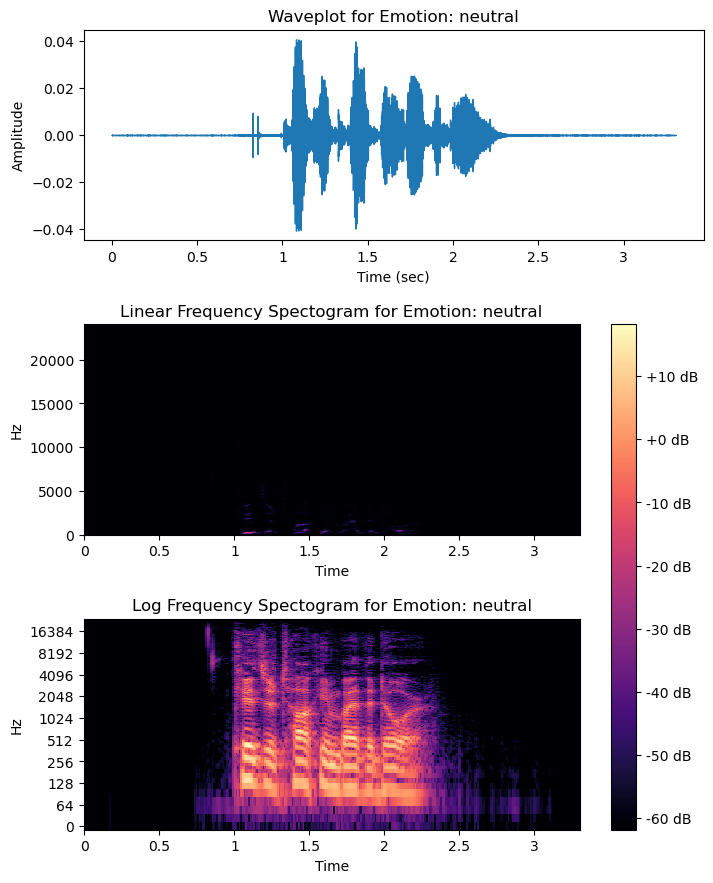

In [17]:
file_path = audio_data[(audio_data['Emotion_Type']== emotion_list[0])]['File_Path'].iloc[0]
wav_data, sampling_rate = librosa.load(file_path, sr=None)
plot_audio(wav_data, sampling_rate, emotion_list[0])
Audio(file_path)

C:\Users\ktanj\AppData\Local\Temp\ipykernel_2880\3731955823.py:23: UserWarning:

Trying to display complex-valued input. Showing magnitude instead.



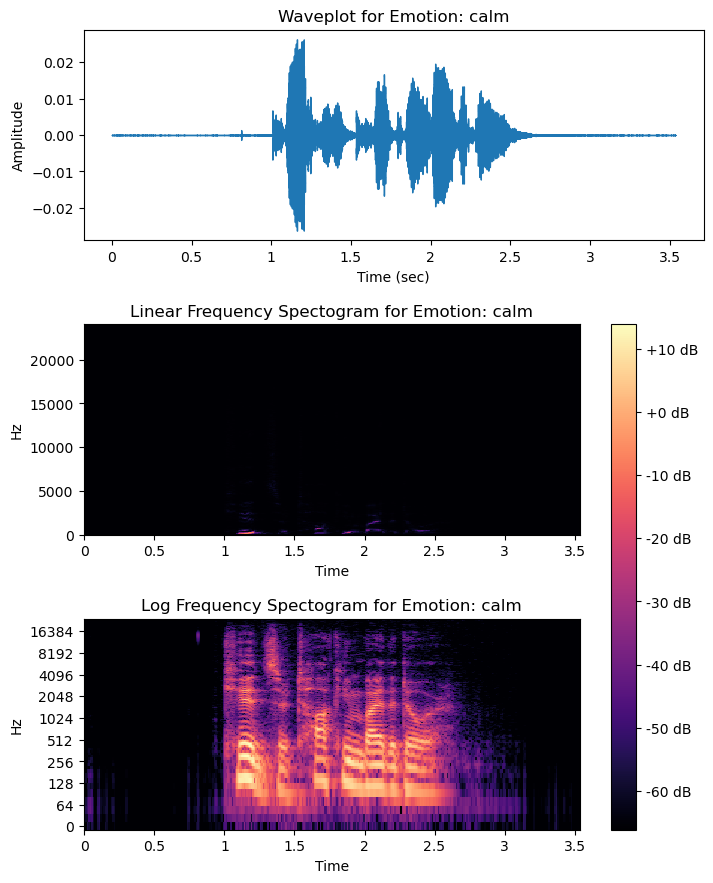

In [18]:
file_path = audio_data[(audio_data['Emotion_Type']== emotion_list[1])]['File_Path'].iloc[0]
wav_data, sampling_rate = librosa.load(file_path, sr=None)
plot_audio(wav_data, sampling_rate, emotion_list[1])
Audio(file_path)

C:\Users\ktanj\AppData\Local\Temp\ipykernel_2880\3731955823.py:23: UserWarning:

Trying to display complex-valued input. Showing magnitude instead.



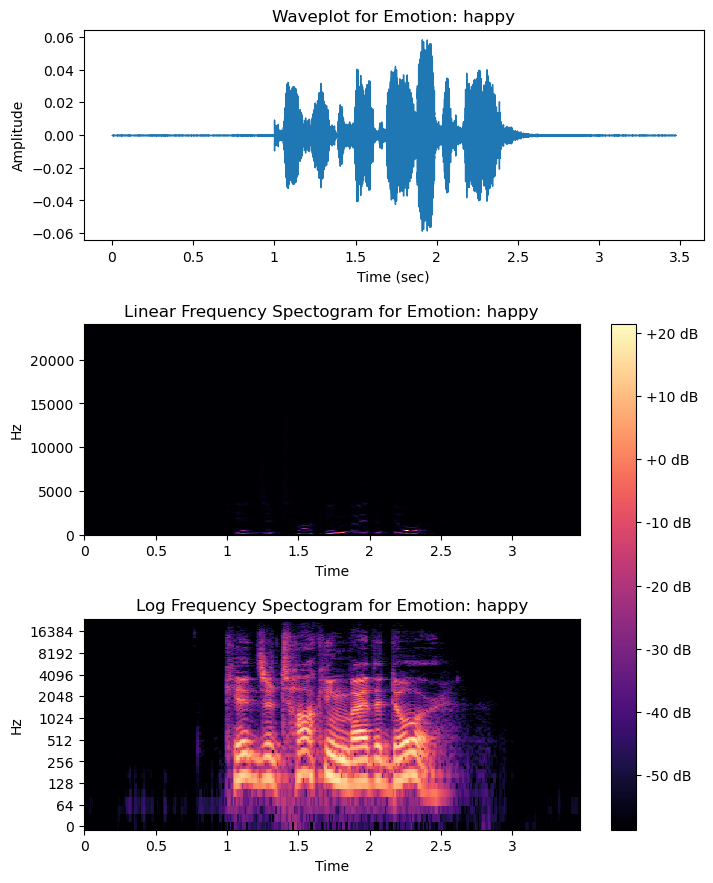

In [19]:
file_path = audio_data[(audio_data['Emotion_Type']== emotion_list[2])]['File_Path'].iloc[0]
wav_data, sampling_rate = librosa.load(file_path, sr=None)
plot_audio(wav_data, sampling_rate, emotion_list[2])
Audio(file_path)

C:\Users\ktanj\AppData\Local\Temp\ipykernel_2880\3731955823.py:23: UserWarning:

Trying to display complex-valued input. Showing magnitude instead.



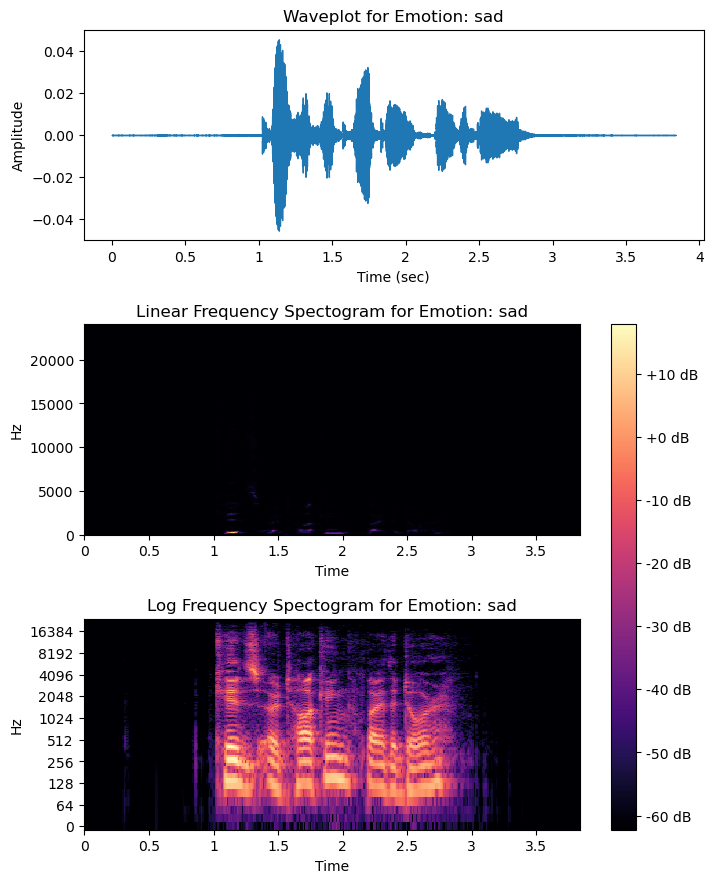

In [20]:
file_path = audio_data[(audio_data['Emotion_Type']== emotion_list[3])]['File_Path'].iloc[0]
wav_data, sampling_rate = librosa.load(file_path, sr=None)
plot_audio(wav_data, sampling_rate, emotion_list[3])
Audio(file_path)

C:\Users\ktanj\AppData\Local\Temp\ipykernel_2880\3731955823.py:23: UserWarning:

Trying to display complex-valued input. Showing magnitude instead.



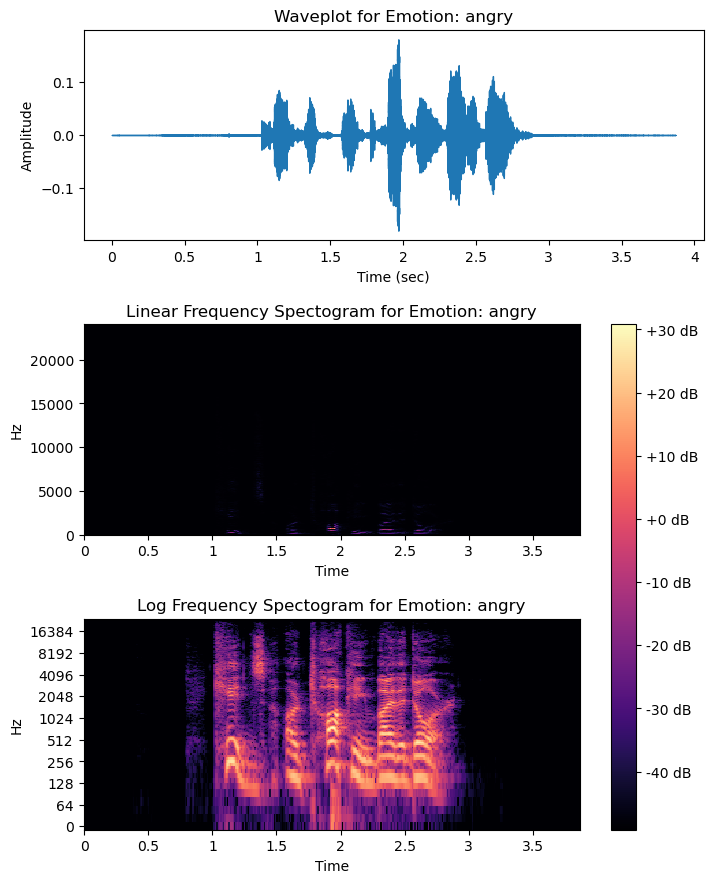

In [21]:
file_path = audio_data[(audio_data['Emotion_Type']== emotion_list[4])]['File_Path'].iloc[0]
wav_data, sampling_rate = librosa.load(file_path, sr=None)
plot_audio(wav_data, sampling_rate, emotion_list[4])
Audio(file_path)

C:\Users\ktanj\AppData\Local\Temp\ipykernel_2880\3731955823.py:23: UserWarning:

Trying to display complex-valued input. Showing magnitude instead.



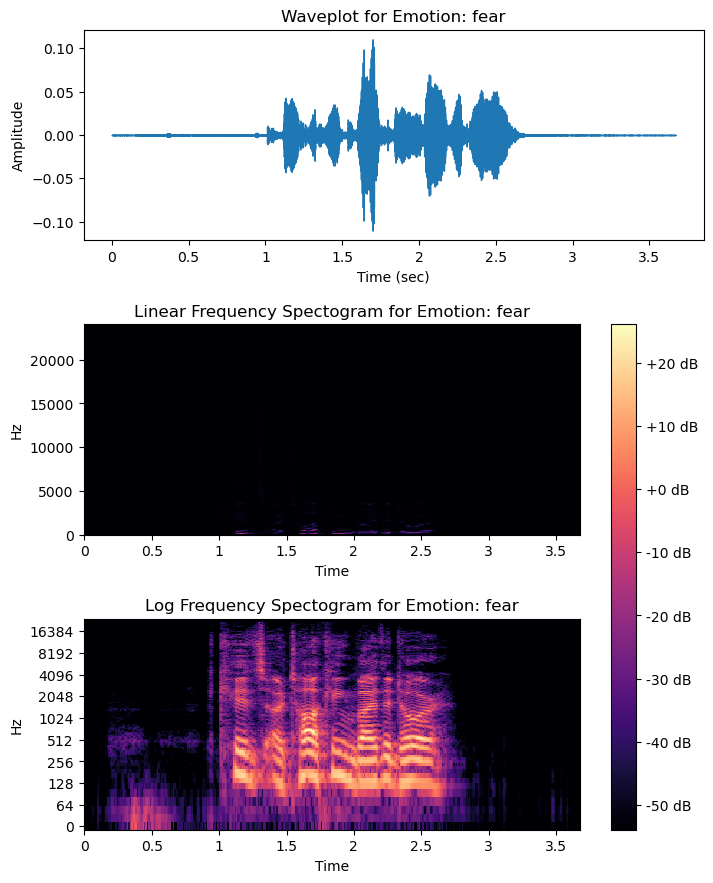

In [22]:
file_path = audio_data[(audio_data['Emotion_Type']== emotion_list[5])]['File_Path'].iloc[0]
wav_data, sampling_rate = librosa.load(file_path, sr=None)
plot_audio(wav_data, sampling_rate, emotion_list[5])
Audio(file_path)

C:\Users\ktanj\AppData\Local\Temp\ipykernel_2880\3731955823.py:23: UserWarning:

Trying to display complex-valued input. Showing magnitude instead.



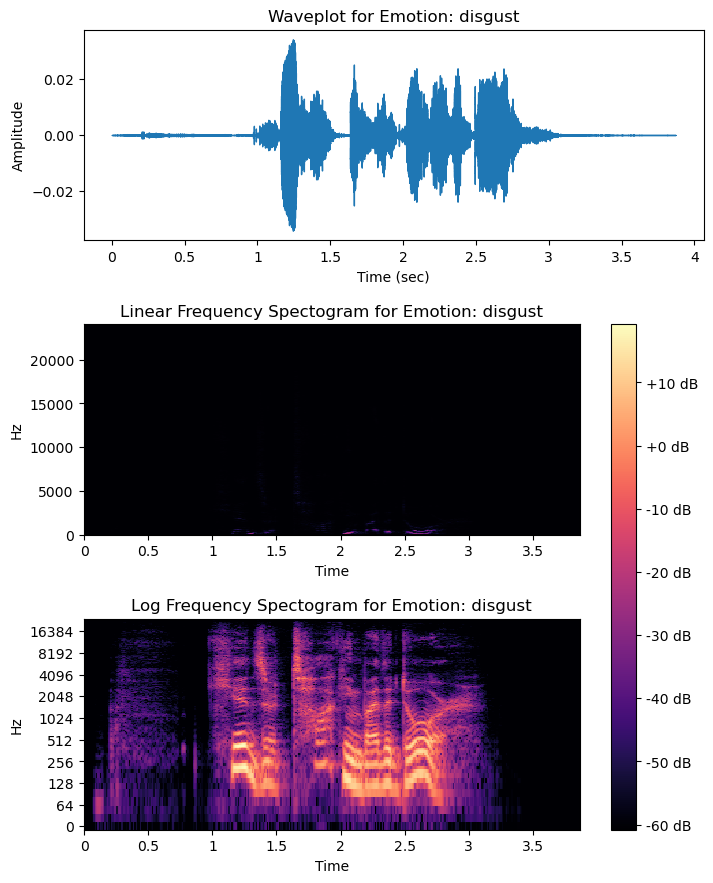

In [23]:
file_path = audio_data[(audio_data['Emotion_Type']== emotion_list[6])]['File_Path'].iloc[0]
wav_data, sampling_rate = librosa.load(file_path, sr=None)
plot_audio(wav_data, sampling_rate, emotion_list[6])
Audio(file_path)

C:\Users\ktanj\AppData\Local\Temp\ipykernel_2880\3731955823.py:23: UserWarning:

Trying to display complex-valued input. Showing magnitude instead.



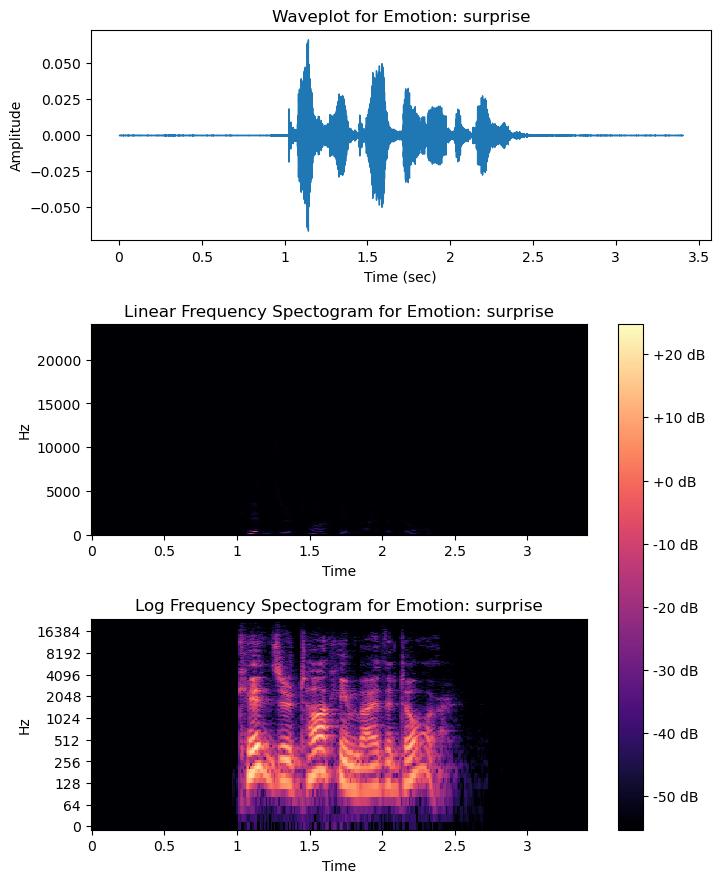

In [24]:
file_path = audio_data[(audio_data['Emotion_Type']== emotion_list[7])]['File_Path'].iloc[0]
wav_data, sampling_rate = librosa.load(file_path, sr=None)
plot_audio(wav_data, sampling_rate, emotion_list[7])
Audio(file_path)

## Data Augmentation Techniques

**Audio clip should not loose its credibility during the transformation.**

In [25]:
sample= audio_data['File_Path'].iloc[0]
wav_data, sample_rate= librosa.load(sample)
Audio(wav_data, rate= sample_rate)

### 1.Time Shifting

In [26]:
#Author: Keyur Paralkar
#Date: Apr 14,2020
#Title: Audio Data Augmentation in python.
#Web address: https://medium.com/@keur.plkar/audio-data-augmentation-in-python-a91600613e47

#move the wave to right bi given shift factor.
#by default, sr= 22050 Hz.
def shift_time(audio, sr):
    #shift_range= int(np.random.uniform(low=-5, high=5)*1000)
    return np.roll(audio, int(sr/10))


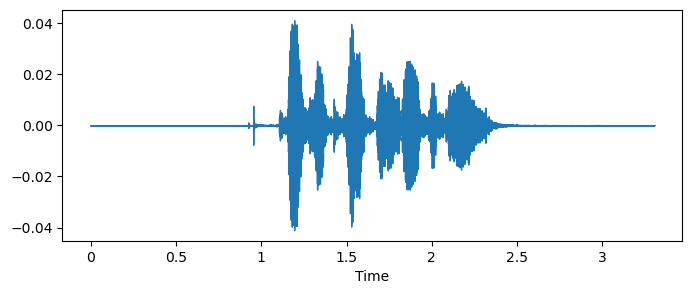

In [27]:
augm_audio= shift_time(wav_data, sample_rate)
plt.figure(figsize=(8,3))
librosa.display.waveshow(y= augm_audio, sr= sample_rate)
Audio(augm_audio, rate= sample_rate)

### 2. Time Stretching

In [28]:
#slow down duration of the signal.
#scale of 0 to 1.
def stretch_time(audio, rate= 0.8):
    return librosa.effects.time_stretch(audio, rate=rate)    

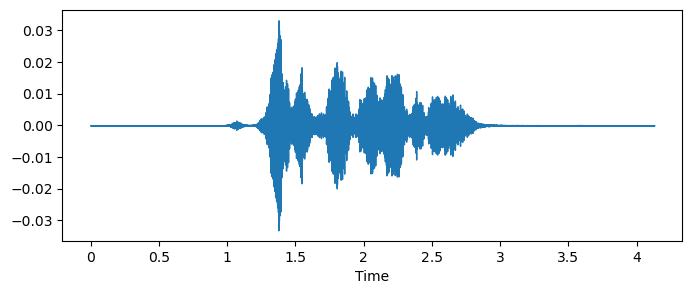

In [29]:
augm_audio= stretch_time(wav_data)
plt.figure(figsize=(8,3))
librosa.display.waveshow(y= augm_audio, sr= sample_rate)
Audio(augm_audio, rate= sample_rate)

### 3.Pitch Scaling

In [30]:
#Increase pitch without changing speed of audio.
def scale_pitch(audio, sample_rate, pitch_factor= 0.7):
    return librosa.effects.pitch_shift(audio, sr=sample_rate, n_steps=pitch_factor)

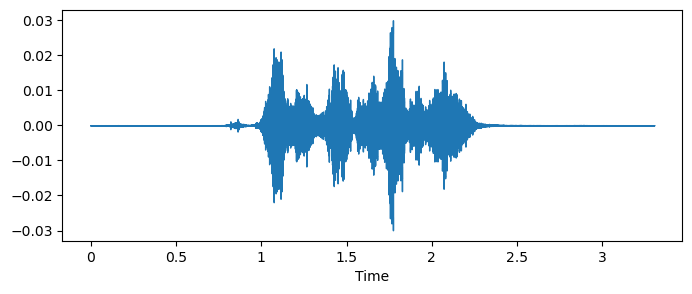

In [31]:
augm_audio= scale_pitch(wav_data, sample_rate)
plt.figure(figsize=(8,3))
librosa.display.waveshow(y= augm_audio, sr= sample_rate)
Audio(augm_audio, rate= sample_rate)

### 4. Noise Addition (Additive White Gaussian Noise)

In [32]:
#Author: Valerio Velrado
#Date: 2022
#Title: Ho to implement audio data augmentation in Python
#Web address: https://youtu.be/umAXGVzVvwQ?feature=shared

def add_noise(audio):
    #scale with noise factor
    #noise_factor= 0.04*np.random.uniform()*np.amax(audio)
    noise= np.random.normal(0, audio.std(), size= audio.shape[0])
    audio= audio+ 0.04 * noise
    return audio

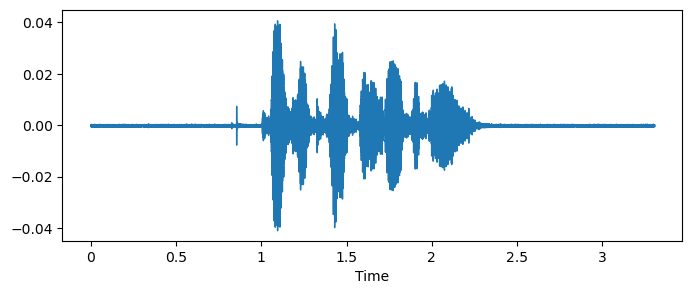

In [33]:
augm_audio= add_noise(wav_data)
plt.figure(figsize=(8,3))
librosa.display.waveshow(y= augm_audio, sr= sample_rate)
Audio(augm_audio, rate= sample_rate)

### 5. Polarity Inversion

In [34]:
#flip signal horizontally
def inverse_polarity(audio):
    return audio*(-1)
    

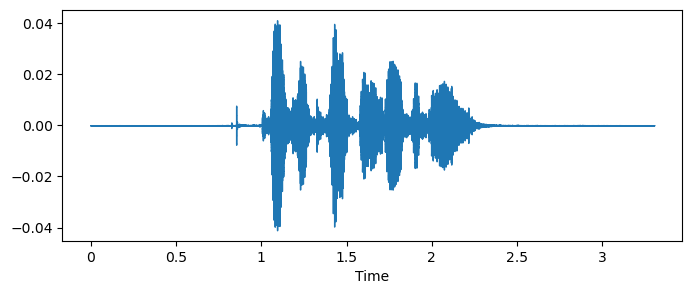

In [35]:
augm_audio= inverse_polarity(wav_data)
plt.figure(figsize=(8,3))
librosa.display.waveshow(y= augm_audio, sr= sample_rate)
Audio(augm_audio, rate= sample_rate)

### 6. Random Gain

In [36]:
#Increasing amplitude range.
def random_gain(audio, min_gain, max_gain):
    gain_factor= np.random.uniform(min_gain, max_gain)
    return audio * gain_factor

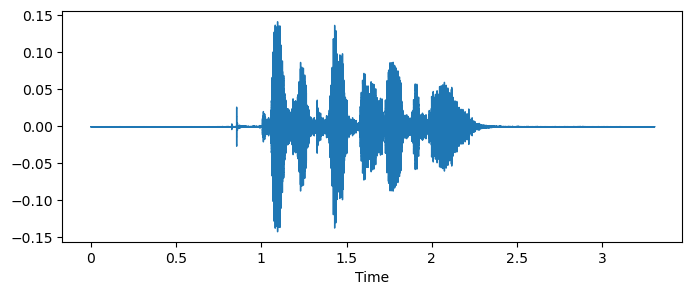

In [37]:
augm_audio= random_gain(wav_data, 2,4)
plt.figure(figsize=(8,3))
librosa.display.waveshow(y= augm_audio, sr= sample_rate)
Audio(augm_audio, rate= sample_rate)

## Feature Extraction Techniques

### 1. Mel spectrogram

In [38]:
def mel_spectrogram(audio, sample_rate, flag=0):
    mel_scaled= librosa.feature.melspectrogram(y= audio, sr= sample_rate)
    
    if(flag==1):
        #to display graph for demonstration
        img= librosa.display.specshow(librosa.power_to_db(mel_scaled, ref= np.max), x_axis='time', y_axis= 'mel', fmax=8000)
        plt.colorbar(img, format= '%+2.f dB')
        plt.show()
        
    mel_output= np.mean(mel_scaled.T, axis=0)
    return mel_output


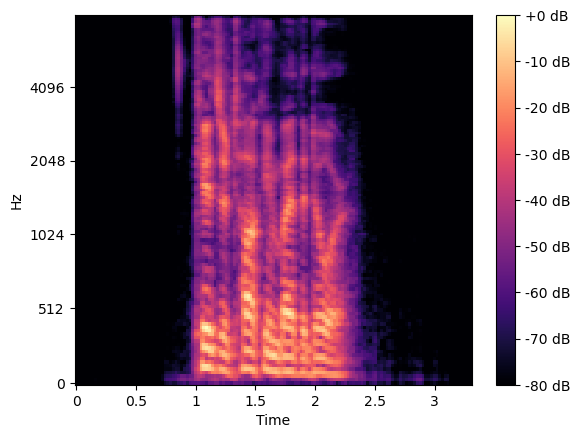

array([1.35779362e-06, 5.59693144e-05, 3.62173491e-03, 2.09322777e-02,
       3.13785188e-02, 1.76727269e-02, 3.45041114e-03, 1.85974017e-02,
       2.46574935e-02, 2.04432663e-02, 2.19461694e-02, 1.07379714e-02,
       7.94237014e-03, 7.29734078e-03, 1.50980884e-02, 3.63865942e-02,
       4.98137735e-02, 1.29359066e-02, 9.52306390e-03, 1.82824954e-02,
       3.88110690e-02, 1.36687700e-02, 2.03864090e-03, 3.92167969e-03,
       1.24075813e-02, 1.84397064e-02, 2.77138292e-03, 7.18480966e-04,
       8.55916005e-04, 8.17747263e-04, 3.14748322e-04, 1.86891819e-04,
       1.98923881e-04, 3.02846485e-04, 6.29401009e-04, 9.28671390e-04,
       6.29798102e-04, 4.32610716e-04, 2.15256732e-04, 5.34899766e-04,
       1.82151212e-03, 1.10188371e-03, 1.44943548e-03, 3.50020221e-03,
       4.61662794e-03, 1.57551386e-03, 5.59797161e-04, 4.50923661e-04,
       8.13638850e-04, 6.43270789e-04, 3.99242475e-04, 7.96465843e-04,
       8.89114279e-04, 6.25676126e-04, 1.02969003e-03, 8.95351171e-04,
      

In [39]:
mel_spectrogram(wav_data, sample_rate, flag=1)

### 2. MFCC- Mel Frequency Cepstrum Coefficient

In [40]:
#Represent texture ot timbre of sound.
def mfcc(audio, sample_rate, flag=0):
    mfcc_data= librosa.feature.mfcc(y= audio, sr= sample_rate)
    
    if(flag==1):
        librosa.display.specshow(mfcc_data, x_axis= 'time')
        plt.colorbar()
        plt.show()
    
    mfcc_output= np.mean(mfcc_data.T, axis=0)
    return mfcc_output
    

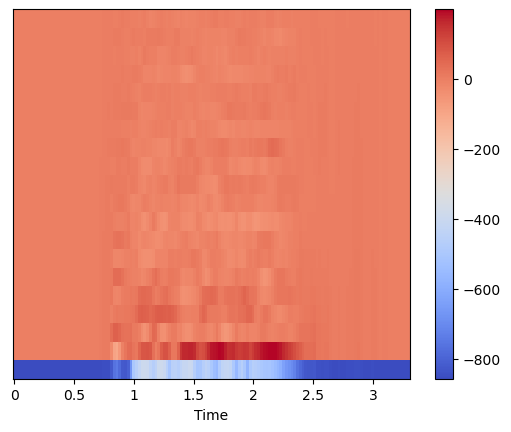

array([-6.9779260e+02,  5.4890041e+01,  6.6346526e-01,  1.2435786e+01,
        7.7339516e+00,  5.3075022e-01, -3.2166312e+00, -3.1593943e+00,
       -1.0977551e+01, -2.8487110e+00,  8.1529737e-01, -3.0370669e+00,
        1.9554467e+00, -3.7356679e+00,  4.3770027e-01,  7.8235644e-01,
       -4.0714283e+00, -1.8607767e+00, -1.3236902e+00, -9.2046338e-01],
      dtype=float32)

In [41]:
mfcc(wav_data, sample_rate, flag= 1)

### 3. Chroma

In [42]:
def chroma(audio, sample_rate, flag=0):
    audio_stft= np.abs(librosa.stft(audio))
    chroma_data= librosa.feature.chroma_stft(S= audio_stft, sr=sample_rate)
    
    if(flag==1):
        librosa.display.specshow(chroma_data, y_axis= 'chroma', x_axis= 'time')
        
    chroma_output= np.mean(chroma_data.T, axis=0)
    return chroma_output
    

array([0.7474327 , 0.7882109 , 0.7766239 , 0.78358555, 0.75299484,
       0.67975664, 0.6812042 , 0.7258947 , 0.7538491 , 0.74456704,
       0.7415531 , 0.72036827], dtype=float32)

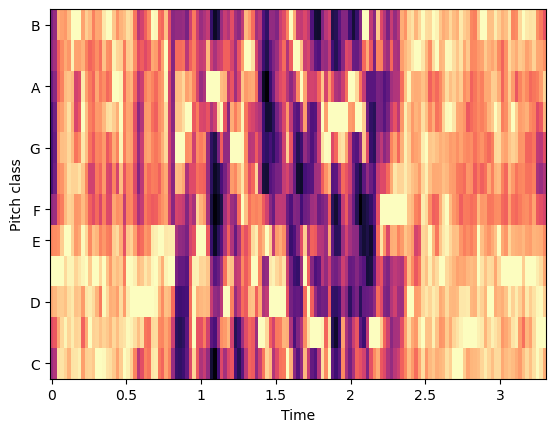

In [43]:
chroma(wav_data, sample_rate, flag=1)

### 4. ZCR - Zero Crossing Rate

In [44]:
def zcr(audio, sample_rate, flag=0):
    zcr_data= librosa.feature.zero_crossing_rate(wav_data)
    if(flag==1):
        plt.title("Zero- Crossing rate over Time")
        plt.plot(zcr_data[0]) 
        
    zcr_output= np.mean(zcr_data.T, axis=0)
    return zcr_output
    

array([0.37271225])

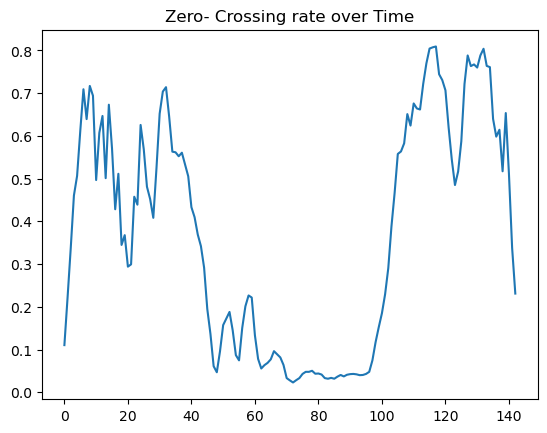

In [45]:
zcr(wav_data, sample_rate, flag=1)

### 5. RMSE

In [46]:
def rmse(audio, flag=0):
    rmse_data= librosa.feature.rms(y=audio)
    if(flag==1):
        plt.title("RMSE of signal over Time")
        plt.plot(rmse_data[0])
        
    rmse_output= np.mean(rmse_data.T, axis=0)
    return rmse_output

array([0.00225609], dtype=float32)

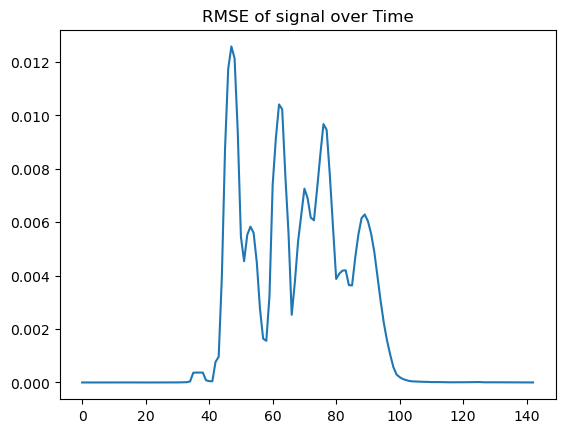

In [47]:
rmse(wav_data, flag=1)

### 6. Spectral Centroid

In [48]:
import sklearn
def spectral_centroid(audio, sample_rate, flag=0):
    spectral_data= librosa.feature.spectral_centroid(y= audio, sr= sample_rate)
    
    if(flag==1):
        
        #---------------------
        #Author: Iran R. Roman
        #Date: Not provided
        #Title: Spectral Features
        #Web address: https://musicinformationretrieval.com/spectral_features.html
        
        frames = range(len(spectral_data[0]))
        t= librosa.frames_to_time(frames)
        norm= sklearn.preprocessing.minmax_scale(spectral_data[0], axis=0) 
        librosa.display.waveshow(audio, sr=sample_rate, alpha=0.4)
        plt.plot(t, norm , color='r')
        #---------------------


    spectral_output= np.mean(spectral_data.T, axis=0)
    return spectral_output     
    
    

array([3470.93768927])

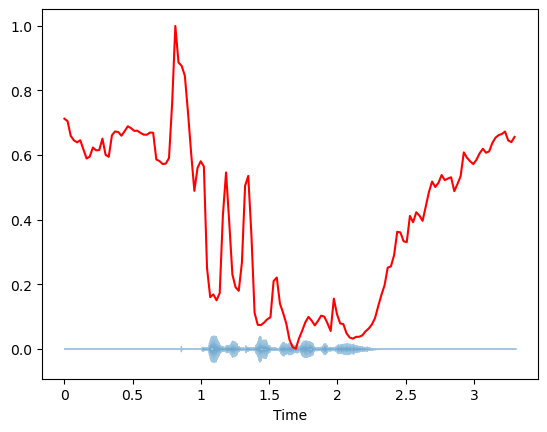

In [49]:
spectral_centroid(wav_data, sample_rate, flag=1)

## Applying data augmentation and extracting features.

In [50]:
#Author: Tushar Gupta
#Date: Dec 13, 2019
#Title: Speech Emotion Detection
#Web address: https://medium.com/@tushar.gupta_47854/speech-emotion-detection-74337966cf2

def get_features(audio, sample_rate):
    output_arr= np.array([])
    
    #Mel spectrogram- Mel frequency cepstral coefficients.
    mel_output= mel_spectrogram(audio, sample_rate, flag=0)
    output_arr= np.hstack((output_arr, mel_output))
    
    #MFCC
    mfcc_output= mfcc(audio, sample_rate, flag= 0)
    output_arr= np.hstack((output_arr, mfcc_output))
    
    #Chroma_stft
    chroma_output= chroma(audio, sample_rate, flag=0)
    output_arr= np.hstack((output_arr, chroma_output))   
    
    #ZCR- number of time signal crosses horizontal axis, i.e, amplitude=0.
    zcr_output= zcr(audio, sample_rate, flag=0)
    output_arr= np.hstack((output_arr, zcr_output))
    
    #RMSE- Root meam square energy of the signal.
    rmse_output= rmse(audio, flag=0)
    output_arr= np.hstack((output_arr, rmse_output))
    
    #Spectral Centroid
    spectral_output= spectral_centroid(audio, sample_rate, flag=0)
    output_arr= np.hstack((output_arr, spectral_output))
    
    return output_arr     
    

## Increasing dataset by applying data augmentation methods.

In [51]:
combined_features= np.array([])

def augment_data(audio, sample_rate):
    transform_1 = get_features(audio, sample_rate)
    combined_features= transform_1
    
    stretch_audio= stretch_time(audio)
    transform_2= get_features(stretch_audio, sample_rate)
    combined_features= np.vstack((combined_features, transform_2))
    
    pitch_audio= scale_pitch(audio, sample_rate)
    transform_3= get_features(pitch_audio, sample_rate)
    combined_features= np.vstack((combined_features, transform_3))
    
    noise_audio= add_noise(audio)
    transform_4= get_features(noise_audio, sample_rate)
    combined_features= np.vstack((combined_features, transform_4))
    
    polarity_audio= inverse_polarity(audio)
    transform_5= get_features(polarity_audio, sample_rate)
    combined_features= np.vstack((combined_features, transform_5))
    
    gain_audio= random_gain(audio, 2, 4)
    transform_6= get_features(gain_audio, sample_rate)
    combined_features= np.vstack((combined_features, transform_6))
    
    return combined_features
    

In [52]:
len(audio_data)

4240

## Splitting the dataset into train, test and validation sets. (80:20)

In [53]:
train_val_audio, test_audio= train_test_split(audio_data, test_size=0.2, random_state= 42)

In [54]:
print(len(train_val_audio))
print(len(test_audio))

3392
848


In [55]:
train_audio, val_audio= train_test_split(train_val_audio, test_size=0.2, random_state= 42)

In [56]:
print(len(train_audio))
print(len(val_audio))

2713
679


**1. Quantifying training audio into features.**

In [57]:
train_X, train_Y= [],[]
for i in range(0,len(train_audio)):

    emotion= train_audio['Emotion_Type'].iloc[i]
    path= train_audio['File_Path'].iloc[i]
    
    audio, sample_rate= librosa.load(path)
    train_features= augment_data(audio, sample_rate)
    for feature in train_features:
        train_X.append(feature)
        train_Y.append(emotion)      
        

In [58]:
train_data= pd.DataFrame(train_X)
train_data['emotion']= train_Y
train_data.to_csv('train_data.csv', index= False)

In [59]:
train_data

,0,1,2,3,4,5,6,7,8,9,...,154,155,156,157,158,159,160,161,162,emotion
0,0.024655,0.003100,0.000663,0.000266,0.001452,0.161362,0.358140,0.212847,0.299065,0.839076,...,0.516394,0.480652,0.485808,0.466538,0.427870,0.438074,0.372712,0.019221,2284.044561,happy
1,0.012458,0.001536,0.000250,0.000094,0.000878,0.145570,0.315753,0.121832,0.193204,0.434552,...,0.549390,0.507045,0.517157,0.484494,0.448670,0.447464,0.372712,0.014122,2231.113999,happy
2,0.010079,0.001173,0.000262,0.000141,0.000232,0.018327,0.080160,0.048488,0.058942,0.137468,...,0.584241,0.522638,0.506504,0.515506,0.455663,0.420604,0.372712,0.013481,2327.844703,happy
3,0.024872,0.003043,0.000644,0.000315,0.001522,0.161134,0.357678,0.213033,0.299197,0.838631,...,0.547303,0.508145,0.517088,0.496779,0.461292,0.478302,0.372712,0.019282,3131.926823,happy
4,0.024655,0.003100,0.000663,0.000266,0.001452,0.161362,0.358140,0.212847,0.299065,0.839076,...,0.516394,0.480652,0.485808,0.466538,0.427870,0.438074,0.372712,0.019221,2284.044561,happy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16273,0.000052,0.000027,0.001375,0.014191,0.025365,0.007158,0.001349,0.013263,0.021033,0.018848,...,0.621056,0.669105,0.793595,0.808548,0.717338,0.692901,0.372712,0.001642,2916.292001,sad
16274,0.000043,0.000029,0.000570,0.008292,0.037225,0.023105,0.001507,0.009432,0.040235,0.017973,...,0.646733,0.632457,0.674554,0.787635,0.809048,0.760530,0.372712,0.001686,2843.631267,sad
16275,0.000087,0.000060,0.002306,0.022481,0.056016,0.018035,0.004693,0.036010,0.056130,0.033878,...,0.641247,0.689023,0.782522,0.785309,0.743075,0.735037,0.372712,0.002488,4112.431902,sad
16276,0.000088,0.000057,0.002303,0.022517,0.056057,0.018050,0.004681,0.036015,0.056106,0.033898,...,0.637060,0.688601,0.796564,0.794817,0.730606,0.702884,0.372712,0.002422,2869.775619,sad


**2. Quantifying validation audio into features.**

In [60]:
val_X, val_Y= [],[]
for i in range(0,len(val_audio)):    
    path= val_audio['File_Path'].iloc[i]
    audio, sample_rate= librosa.load(path)
    val_features= get_features(audio, sample_rate)
    
    val_X.append(val_features)
    val_Y.append(val_audio['Emotion_Type'].iloc[i])          
        
        

In [61]:
val_data= pd.DataFrame(val_X)
val_data['emotion']= val_Y
val_data.to_csv('val_data.csv', index= False)

In [62]:
val_data

,0,1,2,3,4,5,6,7,8,9,...,154,155,156,157,158,159,160,161,162,emotion
0,0.119736,0.133878,0.040497,0.006298,0.025337,0.095322,0.216239,0.409467,0.770817,0.602884,...,0.571976,0.568027,0.573384,0.549268,0.580016,0.637719,0.372712,0.018713,3054.020969,disgust
1,0.027818,0.001336,0.000151,0.000101,0.000143,0.000165,0.000119,0.000188,0.006027,1.831618,...,0.316040,0.329427,0.421552,0.477967,0.480122,0.436898,0.372712,0.021435,3046.332377,fear
2,0.003324,0.000545,0.000256,0.000340,0.000965,0.006558,0.104485,0.816980,1.839440,1.967783,...,0.516539,0.540896,0.558785,0.567292,0.594666,0.627938,0.372712,0.048857,3987.448966,angry
3,0.000050,0.000010,0.000576,0.004419,0.005274,0.012489,0.024868,0.049526,0.030375,0.007069,...,0.666829,0.699366,0.759202,0.789706,0.766309,0.711196,0.372712,0.003096,3102.521729,surprise
4,0.063658,0.001955,0.000274,0.000982,0.025144,0.205010,0.372853,0.367145,0.374217,0.460412,...,0.527811,0.448876,0.448857,0.464770,0.509388,0.514247,0.372712,0.019488,2037.372956,disgust
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
674,0.004944,0.001916,0.000479,0.000320,0.000365,0.000320,0.126291,0.947394,1.270740,1.399239,...,0.335658,0.439764,0.499246,0.534209,0.564862,0.528947,0.372712,0.031638,2975.485441,surprise
675,0.000024,0.000388,0.009953,0.007710,0.000464,0.002955,0.005818,0.004367,0.000958,0.001030,...,0.675907,0.704337,0.649984,0.634110,0.727761,0.787706,0.372712,0.001086,2933.802879,neutral
676,0.038317,0.010822,0.001840,0.002185,0.008271,0.064084,0.217065,0.388987,0.803682,0.513645,...,0.646212,0.580780,0.523968,0.552999,0.592673,0.636492,0.372712,0.024680,3098.704061,disgust
677,0.046520,0.002343,0.003045,0.021619,0.086312,0.890697,1.221374,0.939920,0.197336,0.070865,...,0.529694,0.474985,0.505110,0.447658,0.413948,0.439694,0.372712,0.014506,1874.672401,sad


**3. Quantifying testing audio into features.**

In [63]:
test_X, test_Y= [],[]
for i in range(0,len(test_audio)):    
    path= test_audio['File_Path'].iloc[i]
    audio, sample_rate= librosa.load(path)
    test_features= get_features(audio, sample_rate)
    
    test_X.append(test_features)
    test_Y.append(test_audio['Emotion_Type'].iloc[i])      

In [64]:
test_data= pd.DataFrame(test_X)
test_data['emotion']= test_Y
test_data.to_csv('test_data.csv', index= False)

In [65]:
test_data

,0,1,2,3,4,5,6,7,8,9,...,154,155,156,157,158,159,160,161,162,emotion
0,0.000025,0.000087,0.000241,0.002489,0.034684,0.316280,0.302910,0.456406,0.766434,0.524311,...,0.607517,0.611406,0.657543,0.704018,0.729503,0.766363,0.372712,0.013192,3338.621509,angry
1,0.000015,0.000060,0.000098,0.000073,0.000042,0.000087,0.002454,0.018331,0.044596,0.050169,...,0.560871,0.541951,0.557600,0.534874,0.560081,0.605877,0.372712,0.006395,2950.947918,surprise
2,0.015683,0.000868,0.000096,0.000880,0.006285,0.035197,0.238703,0.189409,0.360251,0.505327,...,0.499840,0.477944,0.489956,0.473787,0.489636,0.509284,0.372712,0.016518,2387.184861,happy
3,0.001541,0.000082,0.000053,0.000138,0.000791,0.006156,0.017164,0.039054,0.106262,0.028928,...,0.718401,0.718062,0.659080,0.621571,0.678243,0.654375,0.372712,0.006895,2853.679190,disgust
4,0.039078,0.021832,0.061114,0.059205,0.032554,0.033406,0.032077,0.032995,0.084702,0.882249,...,0.506443,0.484035,0.416031,0.377476,0.428403,0.546118,0.372712,0.045174,3456.139562,fear
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
843,0.038131,0.001492,0.000140,0.000147,0.002236,0.021825,0.236258,0.321763,0.223092,0.368719,...,0.543053,0.651903,0.566208,0.484953,0.469629,0.506334,0.372712,0.019808,2259.735225,surprise
844,0.148477,0.125505,0.020969,0.020718,0.035362,0.106004,0.440883,0.951763,1.555476,0.566850,...,0.660959,0.592499,0.526886,0.549056,0.532415,0.560795,0.372712,0.018289,2430.820086,disgust
845,0.381828,0.211013,0.209859,0.184458,0.096881,0.147445,0.152665,0.086280,0.398323,0.843200,...,0.448319,0.441237,0.412578,0.404730,0.462948,0.543630,0.372712,0.047198,3266.301690,fear
846,0.008864,0.007019,0.003427,0.002664,0.011038,0.099303,0.593972,1.367203,0.991817,0.211292,...,0.573592,0.599307,0.610436,0.587728,0.545448,0.544373,0.372712,0.018836,2541.567866,disgust


## Preprocessing data for the model.

**1. Scaling the 'X' predictors.**

In [66]:
scaler= StandardScaler()
scaler.fit(train_X)

train_X_tr = scaler.transform(train_X)
val_X_tr = scaler.transform(val_X)
test_X_tr = scaler.transform(test_X)

In [67]:
#We have 2D data, and Cov1D expects 3dimensional tensors.
train_X_tr.shape

(16278, 163)

In [68]:
#Adding third dimension to the 'X' data.
train_X_tr= np.expand_dims(train_X_tr, axis=2)
val_X_tr= np.expand_dims(val_X_tr, axis=2)
test_X_tr= np.expand_dims(test_X_tr, axis=2)

In [69]:
train_X_tr.shape

(16278, 163, 1)

**2. One hot encoding of 'Y' labels.**

In [70]:
#Number of output classes the model can expect.
num_class= len(audio_data['Emotion_Type'].unique())
print(num_class)

8


In [71]:
encoder= OneHotEncoder()

train_Y_encoded = encoder.fit_transform(np.array(train_Y).reshape(-1,1)).toarray()
val_Y_encoded = encoder.fit_transform(np.array(val_Y).reshape(-1,1)).toarray()
test_Y_encoded = encoder.fit_transform(np.array(test_Y).reshape(-1,1)).toarray()

In [72]:
train_Y_encoded

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.]])

## CNN Model Implementation for audio data

In [73]:
model= Sequential()

model.add(Conv1D(128, kernel_size=5, strides=1, padding='same', activation='relu', input_shape= (train_X_tr.shape[1],1)))
model.add(MaxPooling1D(pool_size=5, strides=2, padding='same'))
model.add(Dropout(0.2))

model.add(Conv1D(64, kernel_size=5, strides=1, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=5, strides=2, padding='same'))
model.add(Dropout(0.2))

model.add(Flatten())
model.add(Dense(units=32, activation= 'relu'))
model.add(Dropout(0.2))

model.add(Dense(units= num_class, activation='softmax'))

model.compile(optimizer= 'adam', loss= 'categorical_crossentropy', metrics= ['accuracy'])

history= model.fit(train_X_tr, train_Y_encoded, batch_size=64, epochs=20, validation_data=(val_X_tr, val_Y_encoded))


C:\Users\ktanj\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
255/255 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.4523 - loss: 1.4970 - val_accuracy: 0.7054 - val_loss: 0.8053
Epoch 2/20
255/255 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.6777 - loss: 0.8690 - val_accuracy: 0.7320 - val_loss: 0.7030
Epoch 3/20
255/255 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.7182 - loss: 0.7577 - val_accuracy: 0.7644 - val_loss: 0.6611
Epoch 4/20
255/255 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.7434 - loss: 0.7070 - val_accuracy: 0.7909 - val_loss: 0.6128
Epoch 5/20
255/255 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.7549 - loss: 0.6557 - val_accuracy: 0.7850 - val_loss: 0.5876
Epoch 6/20
255/255 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - accuracy: 0.7651 - loss: 0.6331 - val_accuracy: 0.7923 - val_loss: 0.5837
Epoch 7/20
255/255 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.7717 - loss: 0.6159 - val_accuracy: 0.8041 - val_loss: 0.5742
Epoch 8/20
255/255 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.7791 - loss: 0.5884 - val_accu

In [74]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                      │ (None, 163, 128)            │             768 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d (MaxPooling1D)         │ (None, 82, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 82, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_1 (Conv1D)                    │ (None, 82, 64)              │          41,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_1 (MaxPooling1D)       │ (None, 41, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 41, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 2624)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 32)                  │          84,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 8)                   │             264 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 378,170 (1.44 MB)

 Trainable params: 126,056 (492.41 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 252,114 (984.82 KB)

## Visualize model accuracy and loss.

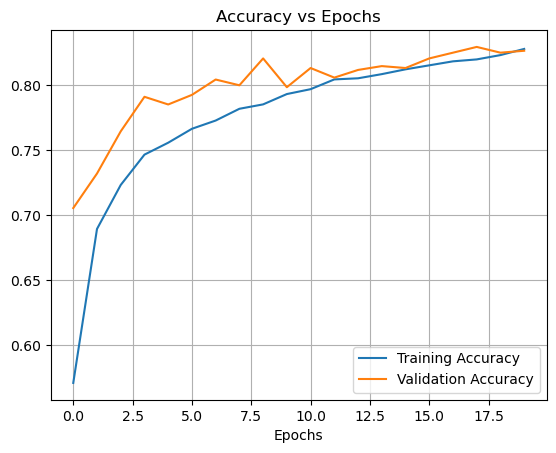

In [75]:
plt.plot(history.history['accuracy'], label= 'Training Accuracy')
plt.plot(history.history['val_accuracy'], label= 'Validation Accuracy')
plt.title('Accuracy vs Epochs')
plt.xlabel('Epochs')
plt.legend(loc='best')
plt.grid(True)
plt.show()


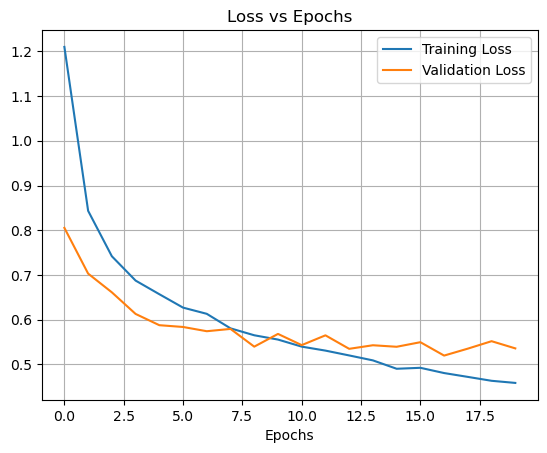

In [76]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss vs Epochs')
plt.xlabel('Epochs')
plt.legend(loc='best')
plt.grid(True)
plt.show()

## Evaluate model on Test set.

In [77]:
model.evaluate(test_X_tr,test_Y_encoded)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7962 - loss: 0.6197


[0.5927148461341858, 0.7877358198165894]

In [78]:
#predicting for 'X' in test set.
predicted= model.predict(test_X_tr)

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


In [79]:
#Author: Thijs Essens
#Title: Standard_scaler.py
#Date: 2020
#Web address: https://gist.github.com/thijsessens/f2ac3dc68ef8a349a723444cb012c821

#Getting actual label values from probabilities.
pred_emotion = encoder.inverse_transform(predicted)
actual_emotion = encoder.inverse_transform(test_Y_encoded)

In [80]:
df= pd.DataFrame()
df['Predicted']= pred_emotion.flatten()
df['Actual']= actual_emotion.flatten()
df

,Predicted,Actual
0,angry,angry
1,surprise,surprise
2,happy,happy
3,sad,disgust
4,fear,fear
...,...,...
843,surprise,surprise
844,disgust,disgust
845,fear,fear
846,disgust,disgust
